# STRANGE ATTRACTOR

LORENZ ATTRACTOR

Plot of the Lorenz Attractor based on Edward Lorenz's 1963 "Deterministic
Nonperiodic Flow" publication.

http://journals.ametsoc.org/doi/abs/10.1175/1520-0469%281963%29020%3C0130%3ADNF%3E2.0.CO%3B2

## Runge-Kutta

In [1]:
def rk4m(x,y,h,n):
    Xlist = [x]
    Ylist = [y]
    for i in range(n):
        k0=f(x,y)
        k1=f(x+h/2.0,y+(h/2)*k0)
        k2=f(x+h/2.0,y+(h/2)*k1)
        k3=f(x+h, y+h*k2)
        # yeni x ve y değerlerini hesapla
        y=y+(h/6)*(k0+2.0*k1+2.0*k2+k3)
        x=x+h
        # hesaplanan x ve y değerlerini
        # xd, yd listelerine ekle
        Xlist.append(x)
        Ylist.append(y)
    return Xlist, Ylist

## Solve the equations

In [2]:
# Aynı programın yeniden düzenlenmiş hali
import numpy as np

def f(x, y):
    # y[0]-->x, y[1]-->y, y[2]-->z
    dxdt =  sigma*(y[1] - y[0])
    dydt = -y[0]*y[2] + rr*y[1] - y[0]
    dzdt = y[0]*y[1] - bb*y[2]
    return np.array([dxdt, dydt, dzdt])

h = 0.0001
n = 20000
dn = 1000
x0 = 0.0
y0 = np.array([1., 1., 20.])

sigma, bb, rr = 10., 8./3., 28.
Xlist, Ylist = rk4m(x0, y0, h, n)

Ylist = np.array(Ylist)
Xs = Ylist[0:,0]
Ys = Ylist[0:,1]
Zs = Ylist[0:,2]

## Plot in 2D

         t            X            Y            Z
     0.000        1.000        1.000       20.000
     0.100        1.912        4.742       15.588
     0.200       13.792       43.274       24.899
     0.300       12.718     -106.877       76.645
     0.400       79.354      350.826      498.850
     0.500     -150.285    -1158.721     1807.087
     0.600     -178.344    -6648.282     4128.237
     0.700      613.840      843.893    28626.937
     0.800     1086.990    50061.368    95465.055
     0.900     1655.493  -290556.803   274823.127
     1.000     4277.596  -398446.225  1430900.024
     1.100    -6598.513   560892.412  4125252.511
     1.200    -2826.266 -3132013.913  4565192.742
     1.300    -3678.529  -460894.207  5513382.943
     1.400     2205.848 -1702972.359  4893099.542
     1.500    -2734.044 -1404877.112  4736657.367
     1.600     3590.877   625313.807  4885652.331
     1.700     3653.781   872422.396  4957466.300
     1.800     3737.915  -518658.185  5082406.706


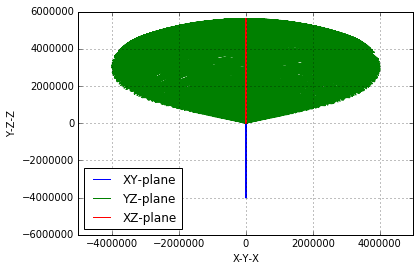

In [3]:
import matplotlib.pyplot as plt
%matplotlib inline
#%matplotlib notebook

print "%10s %12s %12s %12s"%("t","X","Y","Z")
for i in range(0, n, dn):
    print "%10.3f %12.3f %12.3f %12.3f"%(Xlist[i], Xs[i], Ys[i], Zs[i])

plt.plot(Xs, Ys, label='XY-plane')
plt.plot(Ys, Zs, label='YZ-plane')
plt.plot(Xs, Zs, label='XZ-plane')
plt.xlabel('X-Y-X')
plt.ylabel('Y-Z-Z')
plt.grid()
plt.legend(loc='best')
plt.show()

## Plot in 3D

In [4]:
# The code in the following link is 
# used to draw Lorenz Attractor in 3D.
# https://plot.ly/python/3d-line-plots/
#
# Colormaps:
# https://plot.ly/python/cmocean-colorscales/#haline
#
import plotly.offline as py
import plotly.graph_objs as go

py.init_notebook_mode() # run at the start of every ipython notebook to use plotly.offline
                     # this injects the plotly.js source files into the notebook

colormaps = \
['Blackbody', 'Bluered', 'Blues', 'Earth', 
 'Electric', 'Greens', 'Greys', 'Hot', 
 'Jet', 'Picnic', 'Portland', 'Rainbow',
 'RdBu', 'Reds', 'Viridis', 'YlGnBu', 'YlOrRd']
    
trace = go.Scatter3d(
    x=Xs, y=Ys, z=Zs,
    marker=dict(
        size=0.01,
        color=Zs,
        colorscale=colormaps[0],
    ),
    line=dict(
        color=Zs,
        colorscale=colormaps[7],
        width=3
    )
)

data = [trace]

layout = dict(
    width=1000,
    height=900,
    autosize=False,
    title='Iris dataset',
    scene=dict(
        xaxis=dict(
            gridcolor='rgb(255, 255, 255)',
            zerolinecolor='rgb(255, 255, 255)',
            showbackground=True,
            #backgroundcolor='rgb(230, 230,230)' # gray
            backgroundcolor='rgb(180, 255, 230)'
        ),
        yaxis=dict(
            gridcolor='rgb(255, 255, 255)',
            zerolinecolor='rgb(255, 255, 255)',
            showbackground=True,
            #backgroundcolor='rgb(230, 230,230)'
            backgroundcolor='rgb(255, 180, 230)'
            
        ),
        zaxis=dict(
            gridcolor='rgb(255, 255, 255)',
            zerolinecolor='rgb(255, 255, 255)',
            showbackground=True,
            backgroundcolor='rgb(180, 230, 255)',
        ),
        camera=dict(
            up=dict(x=1, y=0, z=0),
            center=dict(x=0, y=0, z=0),
            eye=dict(x=0, y=0, z=2)
        ),
        aspectratio = dict( x=1, y=1, z=1 ),
        aspectmode = 'manual'
    ),
)

fig = dict(data=data, layout=layout)

py.iplot(fig)